## **Predicciones Perros vs Gatos + Transfer Learning + TensorflowJS**

In [1]:
!pip install tf-keras
!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 4.6 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 25.0
    Uninstalling packaging-25.0:
      Successfully uninstalled packaging-25.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xarray 2025.9.0 requires packaging>=24.1, but you have packaging 23.2 which is incompatible.
google-cloud-bigquery 3.36.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


In [1]:
import tensorflow as tf
import tf_keras as keras  # Esto es Keras 2
import tensorflowjs as tfjs

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

In [2]:
# Verifica las versiones
print(f"TensorFlow version: {tf.__version__}")
print(f"tf-keras version: {keras.__version__}")

TensorFlow version: 2.19.0
tf-keras version: 2.19.0


In [3]:
!curl -O https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  786M  100  786M    0     0  94.1M      0  0:00:08  0:00:08 --:--:-- 79.3M


In [4]:
!unzip -q kagglecatsanddogs_5340.zip
!ls PetImages

Cat  Dog


In [5]:
num_skipped = 0

# Recorremos las subcarpetas para eliminar elementos corruptos
for folder_name in ("Cat", "Dog"):
    folder_path = os.path.join("PetImages", folder_name)
    for fname in os.listdir(folder_path):
        fpath = os.path.join(folder_path, fname)

        try:
            # Leer archivo en bruto e intentar decodificar como JPEG
            raw = tf.io.read_file(fpath)
            _ = tf.image.decode_jpeg(raw)
        except Exception:
            # Si falla la lectura/decodificación, eliminamos el archivo
            num_skipped += 1
            os.remove(fpath)

print(f"Deleted {num_skipped} corrupted images.")

Deleted 178 corrupted images.


In [6]:
image_size = 120
batch_size = 32

# Generamos los datasets a partir de la estructura de ficheros
train_ds, val_ds = keras.utils.image_dataset_from_directory(
    "PetImages",
    validation_split=0.15,
    subset="both",
    seed=123,
    image_size=(image_size, image_size),
    batch_size=batch_size,
)

# Obtener las clases antes de transformar
class_names = train_ds.class_names

Found 24824 files belonging to 2 classes.
Using 21101 files for training.
Using 3723 files for validation.


In [7]:
# Se crea un test_ds con el mismo numero de elementos que el val_ds
total_size = tf.data.experimental.cardinality(train_ds).numpy()
test_size = tf.data.experimental.cardinality(val_ds).numpy()
train_size = total_size - test_size

# Crear test_ds tomando los primeros elementos
test_ds = train_ds.take(test_size)

# Crear nuevo train_ds saltando esos elementos
train_ds = train_ds.skip(test_size)

In [8]:
# Obtener el número de elementos por cada dataset
train_count = sum(1 for _ in train_ds.unbatch())
test_count = sum(1 for _ in test_ds.unbatch())
val_count = sum(1 for _ in val_ds.unbatch())
total_count = train_count + test_count + val_count

print(f"Elementos en train_ds: {train_count}, ({train_count/total_count:.4f})")
print(f"Elementos en test_ds: {test_count}, ({test_count/total_count:.4f})")
print(f"Elementos en val_count: {val_count}, ({val_count/total_count:.4f})")
print(f"Total: {total_count}")

Elementos en train_ds: 17357, (0.6992)
Elementos en test_ds: 3744, (0.1508)
Elementos en val_count: 3723, (0.1500)
Total: 24824


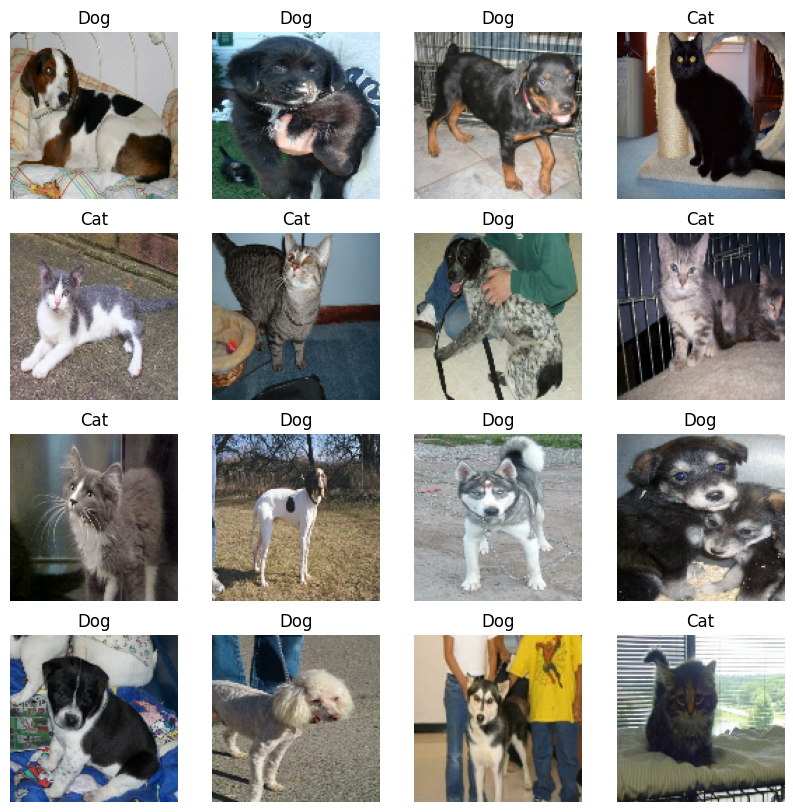

In [9]:
plt.figure(figsize=(10, 10))

# Mostramos las primeras 16 imagenes del primer batch
for images, labels in train_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

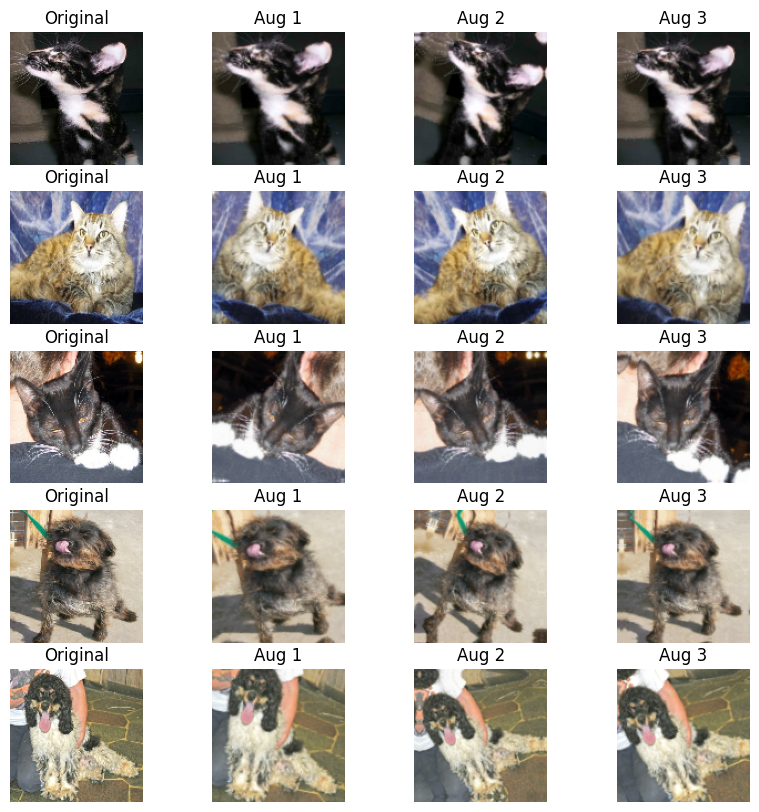

In [10]:
# Ejemplos de data augmentation
data_augmentation = keras.Sequential([
    keras.layers.RandomFlip("horizontal"),  # Volteo horizontal
    keras.layers.RandomRotation(0.1),       # Rotaciones pequeñas
    keras.layers.RandomZoom(0.1),           # Zoom in/out
    keras.layers.RandomContrast(0.05),       # Variar contraste
])

for images, labels in train_ds.take(1):
    sample_images = images[:5]

plt.figure(figsize=(10, 10))

# Graficamos cada imagen original y 3 versiones augmentadas
for i in range(len(sample_images)):
    for j in range(4):
        ax = plt.subplot(len(sample_images), 4, i*4 + j + 1)
        if j == 0:
            plt.imshow(sample_images[i].numpy().astype("uint8"))
            plt.title("Original")
        else:
            augmented = data_augmentation(tf.expand_dims(sample_images[i], 0))
            plt.imshow(augmented[0].numpy().astype("uint8"))
            plt.title(f"Aug {j}")
        plt.axis("off")

plt.show()

In [11]:
# Función que aplica las transformaciones de data_augmentation
def augment(images, labels):
    return data_augmentation(images, training=True), labels

# Aplicas el map a tu dataset de entrenamiento
train_ds = train_ds.map(augment, num_parallel_calls=tf.data.AUTOTUNE)

In [12]:
# Configuramos el dataset para mejorar el rendimiento
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

### **Transfer-Learning:**

In [13]:
from tf_keras import Input, Model, layers
from tf_keras.applications import MobileNetV2

# Carga de MobileNetV2
input_shape = (image_size, image_size, 3)
base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights="imagenet")

# Congelar la base
base_model.trainable = False

# Definición de la cabeza del modelo
inputs = Input(shape=input_shape)
x = layers.Rescaling(1./255)(inputs)
x = base_model(x, training=False) # MobileNetV2
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)

# Construir modelo
model = Model(inputs, outputs)
model.summary()

9406464/9406464 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 120, 120, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 120, 120, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 4, 4, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                

In [14]:
from tf_keras.callbacks import EarlyStopping, TensorBoard
import datetime

#Compilar y entrenar el modelo
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)

log_dir_tl = "logs/fit/transfer_learning/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_tl = TensorBoard(log_dir=log_dir_tl, histogram_freq=1)

history = model.fit(train_ds, validation_data=val_ds, epochs=3, callbacks=[early_stopping, tensorboard_tl])

Epoch 1/3
543/543 [==============================] - 74s 117ms/step - loss: 0.3065 - accuracy: 0.8677 - val_loss: 0.1422 - val_accuracy: 0.9423
Epoch 2/3
543/543 [==============================] - 63s 110ms/step - loss: 0.2371 - accuracy: 0.8977 - val_loss: 0.1314 - val_accuracy: 0.9498
Epoch 3/3
543/543 [==============================] - 63s 110ms/step - loss: 0.2254 - accuracy: 0.9031 - val_loss: 0.1298 - val_accuracy: 0.9479


In [15]:
# Evaluar el modelo en el conjunto de test solo con el Transfer-Learning
test_loss_base, test_acc_base = model.evaluate(test_ds, verbose=0)

print(f"Loss en test: {test_loss_base:.4f}")
print(f"Accuracy en test: {test_acc_base:.4f}")

Loss en test: 0.1232
Accuracy en test: 0.9493


### **Fine-tuning:**

In [16]:
# Descongelar solo las últimas 20 capas
base_model.trainable = True

for layer in base_model.layers[-20:]:
    layer.trainable = False

# Recompilar con learning rate más bajo
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

log_dir_ft = "logs/fit/fine_tuning/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_ft = TensorBoard(log_dir=log_dir_ft, histogram_freq=1)

# Entrenar unas pocas épocas extra
history_fine = model.fit(train_ds, validation_data=val_ds, epochs=5, callbacks=[early_stopping, tensorboard_ft])

Epoch 1/5
543/543 [==============================] - 101s 125ms/step - loss: 0.1731 - accuracy: 0.9273 - val_loss: 0.1118 - val_accuracy: 0.9565
Epoch 2/5
543/543 [==============================] - 71s 125ms/step - loss: 0.1368 - accuracy: 0.9443 - val_loss: 0.0991 - val_accuracy: 0.9621
Epoch 3/5
543/543 [==============================] - 72s 125ms/step - loss: 0.1194 - accuracy: 0.9513 - val_loss: 0.0934 - val_accuracy: 0.9643
Epoch 4/5
543/543 [==============================] - 71s 124ms/step - loss: 0.1114 - accuracy: 0.9553 - val_loss: 0.0892 - val_accuracy: 0.9648
Epoch 5/5
543/543 [==============================] - 72s 127ms/step - loss: 0.1043 - accuracy: 0.9574 - val_loss: 0.0866 - val_accuracy: 0.9651


In [17]:
# Evaluar el modelo en el conjunto de test después del Fine-Tuning
test_loss_ft, test_acc_ft = model.evaluate(test_ds, verbose=0)

print(f"Loss en test: {test_loss_ft:.4f}")
print(f"Accuracy en test: {test_acc_ft:.4f}")

Loss en test: 0.0874
Accuracy en test: 0.9663


In [ ]:
model.save('model.h5')
!tensorflowjs_converter --input_format keras --output_format tfjs_layers_model model.h5 modelos_perros_gatos
!rm -r model.h5

/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2025-09-11 16:22:58.149416: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757607778.168751   17030 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757607778.174681   17030 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1757607778.190163   17030 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1757607778.190186   17030 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1757607778.190190   17030 computation_placer.cc:177] computation placer alr

In [18]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

#### **Guardado y exports de modelos**

In [ ]:
import shutil

# Comprimir todos los modelos
shutil.make_archive('modelos_perros_gatos', 'zip', 'modelos_perros_gatos')

# Descargar el archivo ZIP
from google.colab import files
files.download('modelos_perros_gatos.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!ls -l modelos_perros_gatos/

total 8948
-rw-r--r-- 1 root root 4194304 Sep 11 16:23 group1-shard1of3.bin
-rw-r--r-- 1 root root 4194304 Sep 11 16:23 group1-shard2of3.bin
-rw-r--r-- 1 root root  648452 Sep 11 16:23 group1-shard3of3.bin
-rw-r--r-- 1 root root  121366 Sep 11 16:23 model.json
